In [1]:
import data_preprocessor

In [2]:
bbox = (75.140991,13.074128,75.393677,13.309449)
start_date = '2021-01-01'
end_date = '2021-02-01'
cloud_cover = 10

In [3]:
# Instiate the Preproccesor with parameters
data = data_preprocessor.Preproccesor(bbox=bbox,
                                      start_date = start_date,
                                      end_date = end_date,
                                      cloud_cover = cloud_cover)

In [4]:
# Get all the satellite images and spectral indices
satellite_data, bounds = data.preprocess_satellite_data()

/usr/local/lib/python3.11/dist-packages/pystac_client/item_search.py:940: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


Best item: LC08_L2SP_145051_20210120_02_T1 | Cloud: 0.16%


/usr/local/lib/python3.11/dist-packages/pystac_client/item_search.py:940: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


Clipping the data...
Rescaling the data...
Calculating NDMI....
Calculating NDVI....
Calculating NBR....
Calculating NBR2....
Calculating NDWI....
Calculating MNDWI....
Calculating MNDWI2....
Calculating RVI....
Combining the data...


In [5]:
satellite_data.band.values

array(['red', 'green', 'blue', 'swir16', 'swir22', 'nir08', 'lwir11',
       'HH', 'HV', 'ndmi', 'ndvi', 'nbr', 'nbr2', 'ndwi', 'mndwi',
       'mndwi2', 'rvi'], dtype=object)

In [6]:
# Get the bounds i.e intersecting area between Landsat and ALOS data to get the GEDI data
bounds.to_crs(epsg=4326)

,0
0,"POLYGON ((75.99998 13.8664, 76 13, 75 13, 75 1..."


In [7]:
bounds = bounds.to_crs(epsg=4326).total_bounds
box = tuple(bounds.tolist())

In [ ]:
# Get the GEDI data in csv format
#  data.get_gedi_excel(box)

Enter your Earthdata Login username: sanjay_m
Enter your Earthdata password: ··········


QUEUEING TASKS | :   0%|          | 0/44 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/44 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/44 [00:00<?, ?it/s]

Processing GEDI files:   0%|          | 0/44 [00:00<?, ?it/s]

Processing file 1/44

Writing csv file 1/44
Processing file 2/44

Writing csv file 2/44
Processing file 3/44

Writing csv file 3/44
Processing file 4/44

Writing csv file 4/44
Processing file 5/44

Writing csv file 5/44
Processing file 6/44

Writing csv file 6/44
Processing file 7/44

Writing csv file 7/44
Processing file 8/44

Writing csv file 8/44
Processing file 9/44

Writing csv file 9/44
Processing file 10/44

Writing csv file 10/44
Processing file 11/44

Writing csv file 11/44
Processing file 12/44

Writing csv file 12/44
Processing file 13/44

Writing csv file 13/44
Processing file 14/44

Writing csv file 14/44
Processing file 15/44

Writing csv file 15/44
Processing file 16/44

Writing csv file 16/44
Processing file 17/44

Writing csv file 17/44
Processing file 18/44

Writing csv file 18/44
Processing file 19/44

Writing csv file 19/44
Processing file 20/44

Writing csv file 20/44
Processing file 21/44

Writing csv file 21/44
Processing file 22/44

Writing csv file 22/44
Proces

## Exploratory Data analysis

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

os.getcwd()

'/content'

In [ ]:
#Lets concatenate all the csv files into one dataframe

combined_df = pd.DataFrame()

files = [i for i in os.listdir() if i.endswith('.csv')]

for i in files:
  single_df = pd.read_csv(i)
  combined_df = pd.concat([combined_df, single_df], axis = 0)

combined_df.to_csv('combined_gedi_data.csv')

In [ ]:
combined_df = pd.read_csv('combined_gedi_data.csv')
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62504 entries, 0 to 62503
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0.1   62504 non-null  int64  
 1   Unnamed: 0     62504 non-null  int64  
 2   shot_number    62504 non-null  float64
 3   Latitude       62504 non-null  float64
 4   Longitude      62504 non-null  float64
 5   canopy_height  62504 non-null  int64  
 6   quality        62504 non-null  int64  
 7   sensitivity    62504 non-null  float64
 8   tree_cover     62504 non-null  float64
 9   beam           62504 non-null  object 
dtypes: float64(5), int64(4), object(1)
memory usage: 4.8+ MB


In [ ]:
combined_df.head()

,Unnamed: 0.1,Unnamed: 0,shot_number,Latitude,Longitude,canopy_height,quality,sensitivity,tree_cover,beam
0,0,534485,1.526200e+17,13.342907,75.990624,553,1,0.913798,0.141598,BEAM0011
1,1,534486,1.526200e+17,13.343322,75.990939,775,1,0.913318,0.196548,BEAM0011
2,2,701898,1.526210e+17,13.331267,75.989396,490,1,0.902608,0.108974,BEAM0101
3,3,701900,1.526210e+17,13.332095,75.990026,511,1,0.940038,0.049828,BEAM0101
4,4,701901,1.526210e+17,13.332509,75.990341,455,1,0.913497,0.068374,BEAM0101


In [ ]:
#Remove unnecessary column

combined_df.rename(columns = {
    combined_df.columns[0] : 'Sl.no',
    combined_df.columns[1] : 'x'
}, inplace=True)
combined_df.drop(columns=['x'], inplace=True)
combined_df.head(3)

,Sl.no,shot_number,Latitude,Longitude,canopy_height,quality,sensitivity,tree_cover,beam
0,0,1.526200e+17,13.342907,75.990624,553,1,0.913798,0.141598,BEAM0011
1,1,1.526200e+17,13.343322,75.990939,775,1,0.913318,0.196548,BEAM0011
2,2,1.526210e+17,13.331267,75.989396,490,1,0.902608,0.108974,BEAM0101


In [ ]:
combined_df.isna().sum()

,0
Sl.no,0
shot_number,0
Latitude,0
Longitude,0
canopy_height,0
quality,0
sensitivity,0
tree_cover,0
beam,0


In [ ]:
combined_df.shape

(62504, 9)

In [ ]:
beams = combined_df['beam'].unique()
beams

array(['BEAM0011', 'BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011',
       'BEAM0000', 'BEAM0010', 'BEAM0001'], dtype=object)

In [ ]:
#Convert canopy height from cm to m
combined_df['canopy_height'] = combined_df['canopy_height']/100.0

In [ ]:
# Beamwise statistics

grouped_stats = combined_df.groupby('beam')[['canopy_height', 'tree_cover']].aggregate(['mean', 'median', 'std'])
grouped_stats.T

beam                   BEAM0000   BEAM0001   BEAM0010   BEAM0011   BEAM0101  \
canopy_height mean    15.726821  15.457092  15.246754  15.243027  15.463217   
              median  15.500000  15.270000  15.190000  15.310000  15.300000   
              std      7.275039   7.172935   7.326980   7.492445   8.870528   
tree_cover    mean     0.558203   0.545945   0.502428   0.493429   0.428567   
              median   0.624986   0.603101   0.528788   0.518027   0.401309   
              std      0.286206   0.289801   0.301176   0.309442   0.320569   

beam                   BEAM0110   BEAM1000   BEAM1011  
canopy_height mean    15.120467  16.533544  16.202276  
              median  14.810000  16.180000  15.880000  
              std      8.658203   9.238437   8.909531  
tree_cover    mean     0.420093   0.444816   0.424648  
              median   0.393105   0.424813   0.393524  
              std      0.317571   0.332155   0.326477

In [ ]:
import warnings
warnings.filterwarnings('ignore')

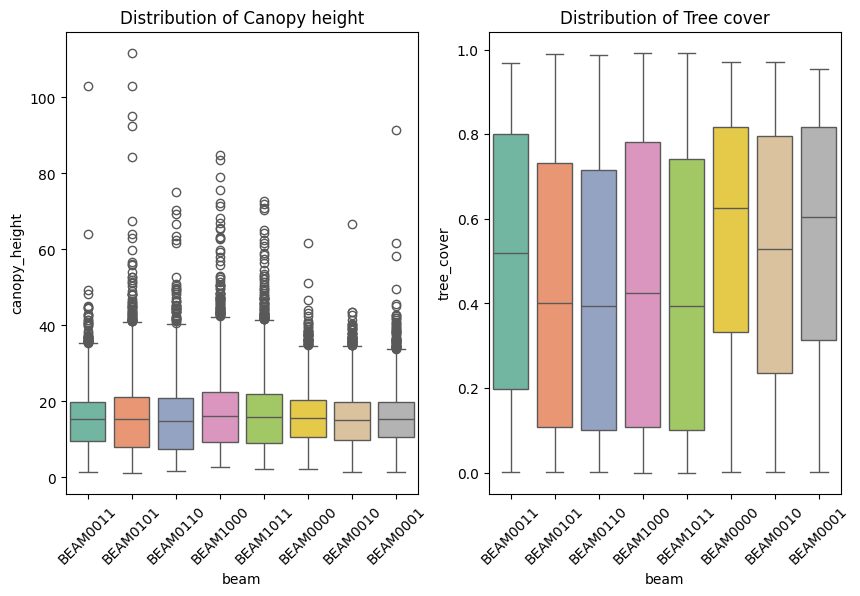

In [ ]:
# Distribution of canopy height and tree cover

fig, ax = plt.subplots(1, 2, figsize = (10, 6))

sns.boxplot(combined_df, x = 'beam', y = 'canopy_height', ax=ax[0], hue= 'beam', palette = 'Set2')
ax[0].set_title('Distribution of Canopy height')
ax[0].tick_params(axis='x', rotation=45)

sns.boxplot(combined_df, x = 'beam', y = 'tree_cover', ax = ax[1],  hue= 'beam', palette='Set2')
ax[1].set_title('Distribution of Tree cover')
ax[1].tick_params(axis='x', rotation=45)

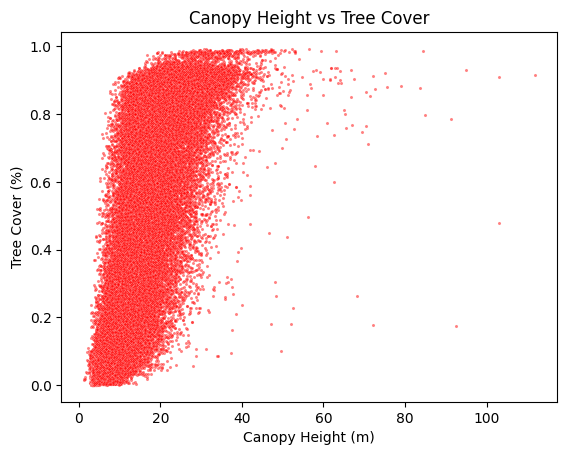

In [ ]:
#Canopy height v/s tree cover

sns.scatterplot(data=combined_df, x='canopy_height', y='tree_cover', color='red', alpha=0.5, s=5)
plt.title("Canopy Height vs Tree Cover")
plt.xlabel("Canopy Height (m)")
plt.ylabel("Tree Cover (%)")
plt.legend().remove()
plt.show()

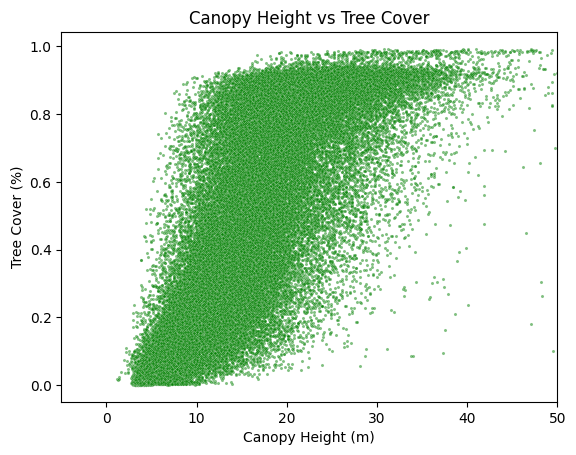

In [ ]:
sns.scatterplot(data=combined_df, x='canopy_height', y='tree_cover', color='green', alpha=0.5, s= 5)
plt.xlim(-5, 50)
plt.title("Canopy Height vs Tree Cover")
plt.xlabel("Canopy Height (m)")
plt.ylabel("Tree Cover (%)")
plt.legend().remove()
plt.show()


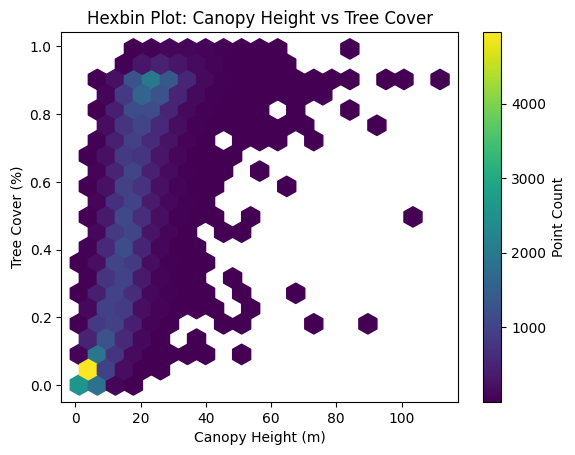

In [ ]:
plt.hexbin(combined_df['canopy_height'], combined_df['tree_cover'], gridsize=20, cmap='viridis', mincnt=1)
plt.colorbar(label='Point Count')
plt.xlabel("Canopy Height (m)")
plt.ylabel("Tree Cover (%)")
plt.title("Hexbin Plot: Canopy Height vs Tree Cover")
plt.show()

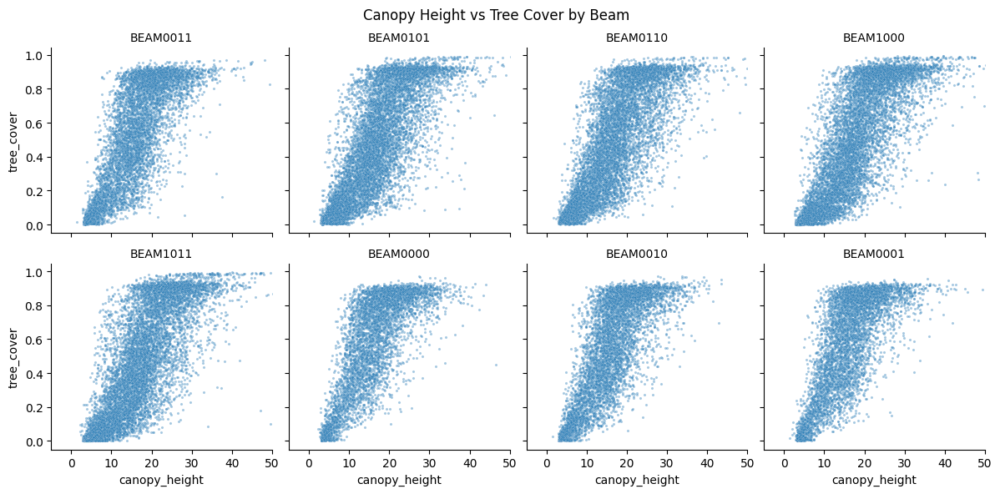

In [ ]:
#Beamwise canopy height v/s tree cover

g = sns.FacetGrid(combined_df, col="beam", col_wrap=4, height=3)
g.map(sns.scatterplot, "canopy_height", "tree_cover", alpha=0.4, s=5)
g.set_titles("{col_name}")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Canopy Height vs Tree Cover by Beam")
plt.xlim(-5, 50)
plt.show()

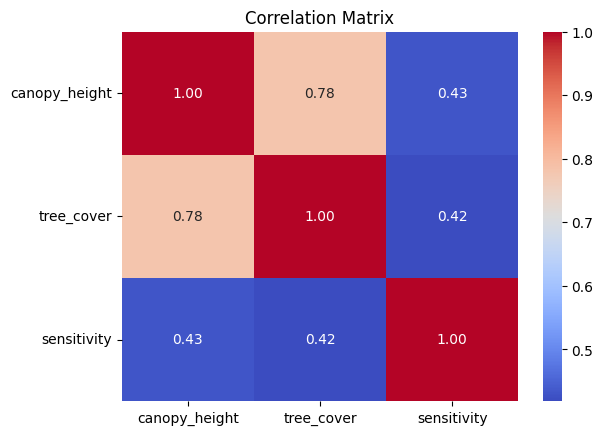

In [ ]:
#Correlation between canopy height and tree cover

corr = combined_df[['canopy_height', 'tree_cover', 'sensitivity']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.tick_params(axis = 'y', labelrotation = 0)
plt.title("Correlation Matrix")
plt.show()

In [ ]:
# Converting dataframe to geodataframe

gedi_gdf = gpd.GeoDataFrame(combined_df, geometry = gpd.points_from_xy(combined_df['Longitude'], combined_df['Latitude']), crs = 'EPSG:4326')
gedi_gdf.drop(columns=['Latitude', 'Longitude'], inplace = True)

In [ ]:
gedi_gdf

,Sl.no,shot_number,canopy_height,quality,sensitivity,tree_cover,beam,geometry
0,0,1.526200e+17,5.53,1,0.913798,0.141598,BEAM0011,POINT (75.99062 13.34291)
1,1,1.526200e+17,7.75,1,0.913318,0.196548,BEAM0011,POINT (75.99094 13.34332)
2,2,1.526210e+17,4.90,1,0.902608,0.108974,BEAM0101,POINT (75.9894 13.33127)
3,3,1.526210e+17,5.11,1,0.940038,0.049828,BEAM0101,POINT (75.99003 13.33209)
4,4,1.526210e+17,4.55,1,0.913497,0.068374,BEAM0101,POINT (75.99034 13.33251)
...,...,...,...,...,...,...,...,...
62499,4805,1.642710e+17,10.06,1,0.915332,0.398894,BEAM1011,POINT (75.99445 13.49475)
62500,4806,1.642710e+17,7.34,1,0.957384,0.109973,BEAM1011,POINT (75.9954 13.49351)
62501,4807,1.642710e+17,15.55,1,0.937104,0.198155,BEAM1011,POINT (75.99824 13.48979)
62502,4808,1.642710e+17,3.75,1,0.943769,0.004476,BEAM1011,POINT (75.9995 13.48814)


In [ ]:
!pip install geoviews
import geoviews as gv
gv.extension('bokeh', 'matplotlib')

In [ ]:
points = gv.Points(gedi_gdf, vdims = ['canopy_height', 'tree_cover']).opts(
                    width=700, height = 550,
                   colorbar=True,
                   title='GEDI Canopy Height Map')

In [ ]:
#GEDI shots - Canopy height
gv.tile_sources.EsriImagery*points.opts(color = 'canopy_height', cmap = 'viridis', tools = ['hover'])

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]   (canopy_height,tree_cover)

In [ ]:
#GEDI shots - Tree cover
gv.tile_sources.EsriImagery*points.opts(color = 'tree_cover', cmap = 'greens', tools = ['hover'])

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]   (canopy_height,tree_cover)

## Raster Exploratory data analysis

(np.float64(499995.0),
 np.float64(608445.0),
 np.float64(1437135.0),
 np.float64(1547805.0))

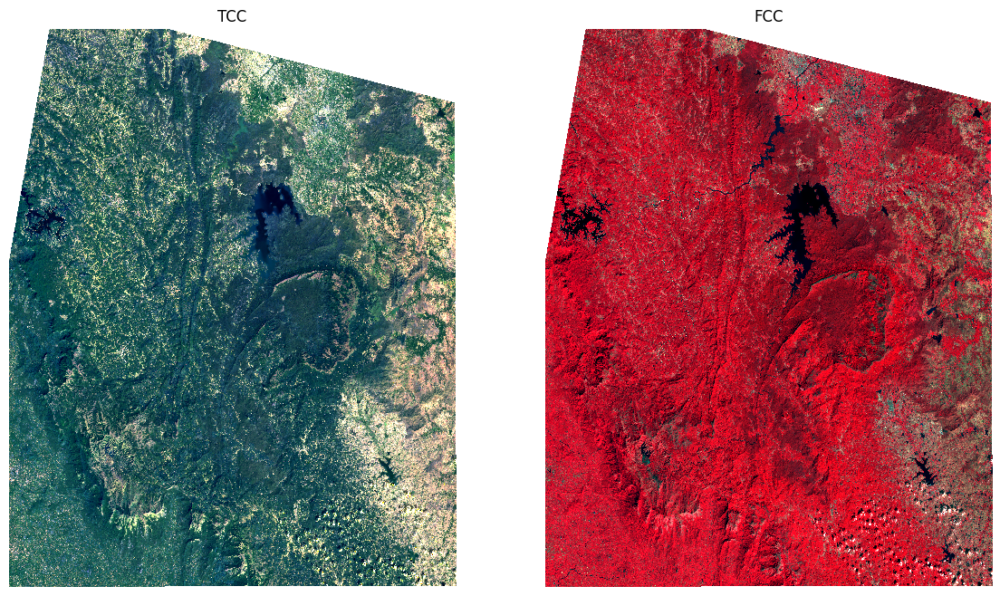

In [ ]:
fig, ax = plt.subplots(1, 2, figsize = (14, 8))

satellite_data.sel(band = ['red', 'green', 'blue']).plot.imshow(ax = ax[0], robust = True)
ax[0].set_title('TCC')
ax[0].axis('off')

satellite_data.sel(band = ['nir08', 'red', 'green']).plot.imshow(ax = ax[1], robust = True)
ax[1].set_title('FCC')
ax[1].axis('off')

In [ ]:
bands = satellite_data.band.values

In [ ]:
indices = bands[9: ]
indices

array(['ndmi', 'ndvi', 'nbr', 'nbr2', 'ndwi', 'mndwi', 'mndwi2', 'rvi'],
      dtype=object)

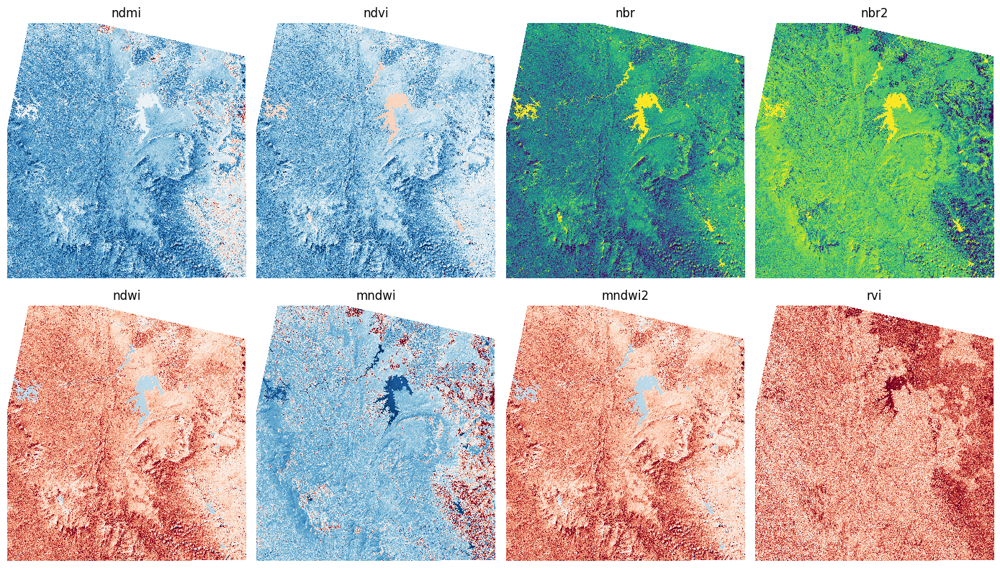

In [ ]:
#Spectral indices plots

fig, ax = plt.subplots(2, 4, figsize = (14, 8))
ax = ax.flatten()

for index, band in  enumerate(indices):
  rast = satellite_data.sel(band = band)
  rast.plot.imshow(ax = ax[index], robust=True, add_colorbar=False)
  ax[index].set_title(band)
  ax[index].axis('off')

plt.tight_layout()
plt.show()

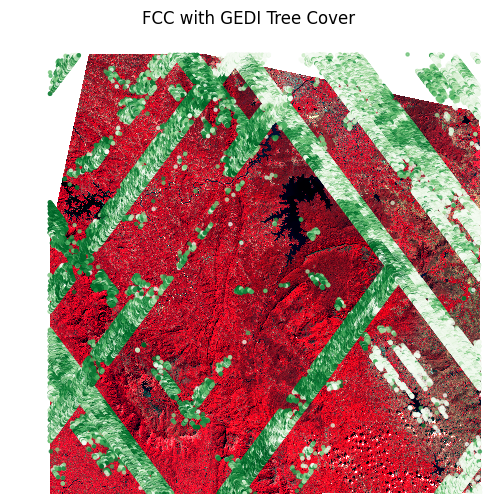

In [ ]:
# GEDI shots upon False color composite

fig, ax = plt.subplots(figsize = (8, 6))

satellite_data.sel(band = ['nir08', 'red', 'green']).plot.imshow(ax = ax, robust= True, add_colorbar=False)
gedi_gdf.to_crs(epsg = 32643).plot(ax = ax,
                                             column = 'tree_cover', cmap = 'Greens', markersize=5,
                                             alpha=0.7)

ax.set_title("FCC with GEDI Tree Cover")
ax.set_xlim(490000, 610000)
ax.set_axis_off()
plt.show()

In [ ]:
bounds

,0
0,"POLYGON ((608055.869 1533176.379, 608446.344 1..."


In [ ]:
#filter out GEDI footprints outside raster bounds

gedi_gdf.to_crs(epsg = 32643, inplace = True)

gedi_gdf_aoi = gedi_gdf[gedi_gdf.within(bounds.geometry.iloc[0])]
gedi_gdf_aoi.head()

,Sl.no,shot_number,canopy_height,quality,sensitivity,tree_cover,beam,geometry
0,0,1.526200e+17,5.53,1,0.913798,0.141598,BEAM0011,POINT (607280.013 1475271.065)
1,1,1.526200e+17,7.75,1,0.913318,0.196548,BEAM0011,POINT (607313.955 1475317.076)
2,2,1.526210e+17,4.90,1,0.902608,0.108974,BEAM0101,POINT (607152.161 1473983.048)
3,3,1.526210e+17,5.11,1,0.940038,0.049828,BEAM0101,POINT (607220.006 1474074.933)
4,4,1.526210e+17,4.55,1,0.913497,0.068374,BEAM0101,POINT (607253.909 1474120.84)


In [ ]:
gedi_gdf_aoi.shape

(57018, 8)

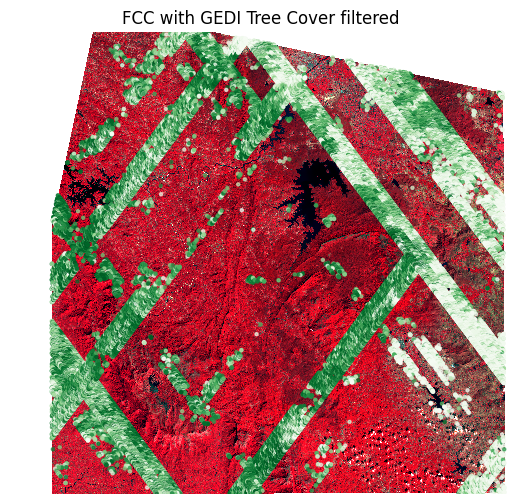

In [ ]:
#Filtered GEDI footprints on FCC

fig, ax = plt.subplots(figsize = (8, 6))

satellite_data.sel(band = ['nir08', 'red', 'green']).plot.imshow(ax = ax, robust= True, add_colorbar=False)
gedi_gdf_aoi.to_crs(epsg = 32643).plot(ax = ax,
                                             column = 'tree_cover', cmap = 'Greens', markersize=5,
                                             alpha=0.7)

ax.set_title("FCC with GEDI Tree Cover filtered")
ax.set_xlim(490000, 610000)
ax.set_axis_off()
plt.show()

In [ ]:
satellite_data.transpose('band', 'y', 'x').rio.to_raster('satellite_data.tif')

In [ ]:
gedi_gdf_aoi.head()

,Sl.no,shot_number,canopy_height,quality,sensitivity,tree_cover,beam,geometry
0,0,1.526200e+17,5.53,1,0.913798,0.141598,BEAM0011,POINT (607280.013 1475271.065)
1,1,1.526200e+17,7.75,1,0.913318,0.196548,BEAM0011,POINT (607313.955 1475317.076)
2,2,1.526210e+17,4.90,1,0.902608,0.108974,BEAM0101,POINT (607152.161 1473983.048)
3,3,1.526210e+17,5.11,1,0.940038,0.049828,BEAM0101,POINT (607220.006 1474074.933)
4,4,1.526210e+17,4.55,1,0.913497,0.068374,BEAM0101,POINT (607253.909 1474120.84)


In [ ]:
# sampling the raster bands along GEDI footprints

gedi_gdf_aoi[bands] = [satellite_data.sel(x = X, y= Y, method = 'nearest').values for X, Y in zip(gedi_gdf_aoi.geometry.x, gedi_gdf_aoi.geometry.y)]

In [ ]:
gedi_gdf_aoi.head()

,Sl.no,shot_number,canopy_height,quality,sensitivity,tree_cover,beam,geometry,red,green,...,HH,HV,ndmi,ndvi,nbr,nbr2,ndwi,mndwi,mndwi2,rvi
0,0,1.526200e+17,5.53,1,0.913798,0.141598,BEAM0011,POINT (607280.013 1475271.065),-0.477758,-0.484868,...,0.036834,0.033433,-0.038515,0.005360,-0.264917,-0.228736,0.002026,-0.036492,0.002026,0.048402
1,1,1.526200e+17,7.75,1,0.913318,0.196548,BEAM0011,POINT (607313.955 1475317.076),-0.482424,-0.489524,...,0.049408,0.028209,0.003319,0.077884,-0.184543,-0.187747,-0.070620,-0.067316,-0.070620,0.273127
2,2,1.526210e+17,4.90,1,0.902608,0.108974,BEAM0101,POINT (607152.161 1473983.048),-0.496667,-0.486063,...,0.068622,0.032816,-0.114567,-0.103529,-0.354693,-0.250297,0.092843,-0.021958,0.092843,0.352985
3,3,1.526210e+17,5.11,1,0.940038,0.049828,BEAM0101,POINT (607220.006 1474074.933),-0.477758,-0.473227,...,0.074572,0.032902,-0.055974,-0.079417,-0.333833,-0.283150,0.074681,0.018786,0.074681,0.387726
4,4,1.526210e+17,4.55,1,0.913497,0.068374,BEAM0101,POINT (607253.909 1474120.84),-0.463697,-0.464859,...,0.057290,0.028843,-0.040181,-0.096615,-0.351843,-0.316131,0.097855,0.057902,0.097855,0.330276


In [ ]:
cor = gedi_gdf_aoi[['canopy_height', 'tree_cover','red', 'green', 'blue', 'swir16',
       'swir22', 'nir08', 'lwir11', 'HH', 'HV', 'ndmi', 'ndvi', 'nbr', 'nbr2',
       'ndwi', 'mndwi', 'mndwi2', 'rvi']].corr()

In [ ]:
cor

,canopy_height,tree_cover,red,green,blue,swir16,swir22,nir08,lwir11,HH,HV,ndmi,ndvi,nbr,nbr2,ndwi,mndwi,mndwi2,rvi
canopy_height,1.000000,0.771833,-0.538381,-0.535236,-0.465302,-0.517619,-0.525531,0.095747,-0.507490,0.270331,0.439060,-0.212910,-0.189450,-0.193909,0.454554,0.168763,-0.307798,0.168763,-0.319441
tree_cover,0.771833,1.000000,-0.563834,-0.543299,-0.475065,-0.521474,-0.545554,0.122776,-0.494683,0.314030,0.518535,-0.230113,-0.214115,-0.223204,0.460021,0.194056,-0.315781,0.194056,-0.363767
red,-0.538381,-0.563834,1.000000,0.952477,0.902958,0.930865,0.961966,-0.071555,0.646512,-0.372002,-0.562147,0.394094,0.304254,0.254429,-0.905502,-0.247519,0.618967,-0.247519,0.407352
green,-0.535236,-0.543299,0.952477,1.000000,0.925975,0.894085,0.896666,0.128482,0.660650,-0.336477,-0.537763,0.288132,0.144613,0.042516,-0.868486,-0.086018,0.560213,-0.086018,0.401458
blue,-0.465302,-0.475065,0.902958,0.925975,1.000000,0.872703,0.878097,0.022481,0.616113,-0.304232,-0.461894,0.326713,0.208948,0.133322,-0.843860,-0.175823,0.557649,-0.175823,0.337080
swir16,-0.517619,-0.521474,0.930865,0.894085,0.872703,1.000000,0.976401,0.046241,0.640019,-0.354406,-0.489706,0.358203,0.201582,0.160353,-0.955110,-0.133758,0.670145,-0.133758,0.333968
swir22,-0.525531,-0.545554,0.961966,0.896666,0.878097,0.976401,1.000000,-0.078988,0.641817,-0.369325,-0.529452,0.409662,0.300019,0.281537,-0.938098,-0.238585,0.667220,-0.238585,0.370822
nir08,0.095747,0.122776,-0.071555,0.128482,0.022481,0.046241,-0.078988,1.000000,0.010338,0.050339,0.063404,-0.395226,-0.734066,-0.958648,-0.084383,0.815168,0.008019,0.815168,-0.041658
lwir11,-0.507490,-0.494683,0.646512,0.660650,0.616113,0.640019,0.641817,0.010338,1.000000,-0.223604,-0.425187,0.230405,0.148749,0.133667,-0.586303,-0.112381,0.403005,-0.112381,0.351398
HH,0.270331,0.314030,-0.372002,-0.336477,-0.304232,-0.354406,-0.369325,0.050339,-0.223604,1.000000,0.525063,-0.151622,-0.117378,-0.115968,0.345820,0.088599,-0.247403,0.088599,0.193641


## Building a deep neural network for canopy cover classification

In [7]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from tqdm.auto import tqdm
import pandas as pd
from sklearn.preprocessing import StandardScaler

In [3]:
gedi_gdf_aoi = pd.read_csv('/content/gedi_gdf_aoi_sampled.csv')

In [4]:
gedi_gdf_aoi.shape

(56995, 26)

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [9]:
#Building a model that can predict canopy cover percentage and canopy height simultaneously

class CanopyClassifier(nn.Module):
  def __init__(self, in_features, out_features, hidden_units = 36):
    super().__init__()

    self.model = nn.Sequential(
        nn.Linear(in_features, hidden_units),
        nn.ReLU(),
        nn.Linear(hidden_units, out_features = hidden_units),
        nn.ReLU(),
        nn.Linear(hidden_units, hidden_units),
        nn.ReLU(),
        nn.Linear(hidden_units, hidden_units),
        nn.ReLU(),
        nn.Linear(hidden_units, out_features)
    )

  def forward(self, x):
    return self.model(x)



In [10]:
class CanopyDataset(Dataset):
  def __init__(self, X, y):
    super().__init__()

    self.X = torch.tensor(X, dtype = torch.float)
    self.y = torch.tensor(y, dtype = torch.float)

  def __len__(self):
    return len(self.X)

  def __getitem__(self, idx):
    return self.X[idx], self.y[idx]

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

X = gedi_gdf_aoi[['red', 'green', 'blue', 'swir16',
       'swir22', 'nir08', 'lwir11', 'HH', 'HV', 'ndmi', 'ndvi', 'nbr', 'nbr2',
       'ndwi', 'mndwi', 'mndwi2', 'rvi']]

y = gedi_gdf_aoi[['canopy_height', 'tree_cover']]

X = torch.from_numpy(X.values).type(torch.float)
y = torch.from_numpy(y.values).type(torch.float)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)

scaler = StandardScaler()

scaled_xtrain = scaler.fit_transform(X_train)
scaled_xtest = scaler.fit_transform(X_test)

In [10]:
scaled_xtrain.shape, y_train.shape, scaled_xtest.shape, y_test.shape

((45596, 17), torch.Size([45596, 2]), (11399, 17), torch.Size([11399, 2]))

In [ ]:
train_dataset = CanopyDataset(scaled_xtrain, y_train)
test_dataset = CanopyDataset(scaled_xtest, y_test)

train_dataloader = DataLoader(train_dataset, batch_size = 32, shuffle = True)
test_dataloader = DataLoader(test_dataset, batch_size = 32, shuffle = True)

In [12]:
# Instantiate the model
# Note : The output has 2 layers, one for canopy cover, one for canopy height
# Define loss function and optimizer

canopy_model = CanopyClassifier(17, 2, 36)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(canopy_model.parameters(),
                       lr = 0.001)

In [13]:
canopy_model

CanopyClassifier(
  (model): Sequential(
    (0): Linear(in_features=17, out_features=36, bias=True)
    (1): ReLU()
    (2): Linear(in_features=36, out_features=36, bias=True)
    (3): ReLU()
    (4): Linear(in_features=36, out_features=36, bias=True)
    (5): ReLU()
    (6): Linear(in_features=36, out_features=36, bias=True)
    (7): ReLU()
    (8): Linear(in_features=36, out_features=2, bias=True)
  )
)

In [14]:
test_tensor = torch.rand(1, 17)
test_tensor

tensor([[0.9570, 0.3667, 0.3910, 0.2162, 0.4085, 0.7064, 0.5776, 0.8797, 0.0833,
         0.9763, 0.2830, 0.2008, 0.6831, 0.2702, 0.8819, 0.9814, 0.9753]])

In [15]:
#Testing the output of the model with a random tensor

canopy_model.eval()
with torch.inference_mode():
  y_logits = canopy_model(test_tensor)
  print(y_logits)

tensor([[ 0.0973, -0.1296]])


In [16]:
#Training loop

def train(epochs, model, loss_fn, train_loader, test_loader, optimizer, device):

  model.to(device)

  for epoch in tqdm(range(epochs)):

    model.train()
    train_loss = 0
    y_train_true = []
    y_train_pred = []

    for x_train, y_train in train_loader:
      x_train = x_train.to(device)
      y_train = y_train.to(device)

      optimizer.zero_grad()
      y_pred = model(x_train)

      loss = loss_fn(y_pred, y_train)

      loss.backward()

      optimizer.step()

      train_loss += loss.item()
      y_train_true.extend(y_train.cpu().numpy())
      y_train_pred.extend(y_pred.detach().cpu().numpy())

    avg_train_loss = train_loss / len(train_loader)
    train_r2 = r2_score(y_train_true, y_train_pred, multioutput='uniform_average')

    model.eval()
    test_loss = 0
    y_val_true = []
    y_val_pred = []

    with torch.no_grad():

      for x_test, y_test in test_loader:
        x_test = x_test.to(device)
        y_test = y_test.to(device)

        test_pred = model(x_test)
        pred_loss = loss_fn(test_pred, y_test)

        test_loss += pred_loss.item()

        y_val_true.extend(y_test.cpu().numpy())
        y_val_pred.extend(test_pred.cpu().numpy())

    avg_test_loss = test_loss / len(test_loader)
    test_r2 = r2_score(y_val_true, y_val_pred, multioutput='uniform_average')

    if (epoch+1) % 20 == 0:
      print(f'\nEpoch{epoch+1}')
      print(f'Train loss : {avg_train_loss:.2f} | Test loss : {avg_test_loss:.2f}')
      print(f'Train R2 : {train_r2} | Test R2 : {test_r2}')

  print('\nTraining complete')

In [17]:
#Training the model

canopy_model_results = train(epochs = 200, model = canopy_model, loss_fn = loss_fn,
      train_loader = train_dataloader, test_loader = test_dataloader,
      optimizer= optimizer, device = device)

  0%|          | 0/200 [00:00<?, ?it/s]


Epoch20
Train loss : 19.57 | Test loss : 20.47
Train R2 : 0.4399348707908369 | Test R2 : 0.44507103866462194

Epoch40
Train loss : 19.17 | Test loss : 21.25
Train R2 : 0.4527077492112223 | Test R2 : 0.4321852025483467

Epoch60
Train loss : 18.93 | Test loss : 20.46
Train R2 : 0.45803029247535043 | Test R2 : 0.4455886164263257

Epoch80
Train loss : 18.63 | Test loss : 20.66
Train R2 : 0.466922656817384 | Test R2 : 0.4417404269781337

Epoch100
Train loss : 18.36 | Test loss : 20.82
Train R2 : 0.4707860936694664 | Test R2 : 0.4404792292772149

Epoch120
Train loss : 18.11 | Test loss : 20.82
Train R2 : 0.4756625627908343 | Test R2 : 0.417185289096912

Epoch140
Train loss : 17.91 | Test loss : 20.94
Train R2 : 0.48051411914135356 | Test R2 : 0.4333007736614525

Epoch160
Train loss : 17.76 | Test loss : 21.10
Train R2 : 0.4826050096237288 | Test R2 : 0.4299355793738883

Epoch180
Train loss : 17.56 | Test loss : 21.19
Train R2 : 0.4848694967589075 | Test R2 : 0.42413331368987495

Epoch200
Tr

In [30]:
#Testing the output of the trained model on a tensor from test set

canopy_model.eval()
with torch.inference_mode():
  y_logits = canopy_model(next(iter(test_dataloader))[0][30])
  print(y_logits)

tensor([16.9168,  0.5236])


In [31]:
#Saving the trained model
from pathlib import Path

save_path = Path('model')
save_path.mkdir(parents=True, exist_ok=True)

file_name = 'canopy_model.pth'
model_save_path = save_path / file_name

torch.save(canopy_model.state_dict(), model_save_path)

In [11]:
#Loading the trained model

canopy_model_loaded = CanopyClassifier(17, 2, 36)
canopy_model_loaded.load_state_dict(torch.load('/content/canopy_model.pth', weights_only=True))

<All keys matched successfully>

### Predicting the canopy height and canopy cover over the entire image using the trained model

In [12]:
satellite_data.shape

(3689, 3615, 17)

In [13]:
bands = satellite_data.band.values

In [ ]:
#Convert the entire satellite image into a pandas dataframe
#Fill the NaN values with mean in the raster simultaneously

import pandas as pd
raster_df = pd.DataFrame()

for i in bands:
  raster_df[i] = satellite_data.sel(band = i).values.flatten()
  raster_df[i].fillna(raster_df[i].mean(), inplace = True)

In [15]:
raster_df.shape

(13335735, 17)

In [14]:
raster_df.isna().sum()

,0
red,0
green,0
blue,0
swir16,0
swir22,0
nir08,0
lwir11,0
HH,0
HV,0
ndmi,0


In [16]:
#converting dataframe into a tensor

scaler = StandardScaler()

ras_tensor = scaler.fit_transform(raster_df.values)

ras_tensor = torch.tensor(ras_tensor, dtype=torch.float).to(device)
ras_tensor.shape

torch.Size([13335735, 17])

In [46]:
ras_tensor[:1, :].shape

torch.Size([1, 17])

In [23]:
#Predicting on a random tensor

import random

idx = random.randint(0, 13335735)

canopy_model_loaded.eval()
with torch.inference_mode():
  y_logits = canopy_model_loaded(ras_tensor[idx-1 : idx, :])
  print(y_logits)

tensor([[19.6871,  0.5995]])


In [17]:
# Predicting on entire dataframe(entire image)

canopy_model_loaded.eval()
with torch.inference_mode():
  predictions = canopy_model_loaded(ras_tensor)

In [18]:
predictions[:, 1].mean()

tensor(0.4436)

In [19]:
#reshaping the predicted canopy height and canopy cover into original satellite image shape
prediction_reshaped = torch.reshape(predictions, (satellite_data.shape[0], satellite_data.shape[1], 2))

In [20]:
prediction_reshaped.shape

torch.Size([3689, 3615, 2])

In [74]:
prediction_reshaped.numpy().shape

(3689, 3615, 2)

In [22]:
import matplotlib.pyplot as plt

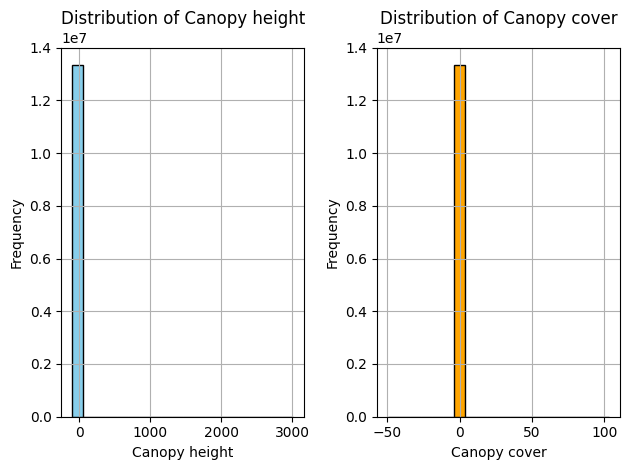

In [23]:
#Distribution of predicted canopy height and canopy cover
plt.subplot(1, 2, 1)
plt.hist(prediction_reshaped.numpy()[:, :, 0].flatten(), bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution of Canopy height")
plt.xlabel("Canopy height")
plt.ylabel("Frequency")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.hist(prediction_reshaped.numpy()[:, :, 1].flatten(), bins=20, color='orange', edgecolor='black')
plt.title("Distribution of Canopy cover")
plt.xlabel("Canopy cover")
plt.ylabel("Frequency")
plt.grid(True)

plt.tight_layout()

In [24]:
#Save the predicted raster as data array with predicted canopy height and canopy cover as its bands

import xarray as xr
import numpy as np

pred_numpy = prediction_reshaped.numpy()
x_coords = satellite_data.x
y_coords = satellite_data.y

canopy_da = xr.DataArray(
    pred_numpy,
    dims=["y", "x", "variable"],
    coords={
        "y": y_coords,
        "x": x_coords,
        "variable": ["canopy_height", "tree_cover"]
    },
    name="canopy_prediction"
)

In [25]:
transform = satellite_data.rio.transform()
canopy_da.rio.write_crs("epsg:32643", inplace=True)
canopy_da.rio.write_transform(transform, inplace=True)

<xarray.DataArray 'canopy_prediction' (y: 3689, x: 3615, variable: 2)> Size: 107MB
array([[[14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        ...,
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593]],

       [[14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        ...,
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593]],

       [[14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        ...,
...
        ...,
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593]],

       [[14.704512  ,  0.44615197],
        [12.946556  ,  0.38674343],
        [16.489117  ,  0.43948978],
        ...,
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593]],

       [[12.720724  ,  0.3680856 ],
        [16.81228   ,  0.49847063],
        [14.100021  ,  0.35325122],
        ...,
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590593],
        [14.649891  ,  0.43590584]]], dtype=float32)
Coordinates:
  * y            (y) float64 30kB 1.548e+06 1.548e+06 ... 1.437e+06 1.437e+06
  * x            (x) float64 29kB 5e+05 5e+05 5.001e+05 ... 6.084e+05 6.084e+05
  * variable     (variable) <U13 104B 'canopy_height' 'tree_cover'
    spatial_ref  int64 8B 0

In [41]:
!pip install rioxarray
import rioxarray as rxr


In [26]:
print(f'Shape of data array: {canopy_da.shape}')

Shape of data array: (3689, 3615, 2)


In [27]:
#Clip out few extreme values in the predicted raster
canopy_da.loc[dict(variable='tree_cover')] = canopy_da.sel(variable='tree_cover').clip(0.0, 1.0)
canopy_da.loc[dict(variable='canopy_height')] = canopy_da.sel(variable='canopy_height').clip(0.0, 40.0)

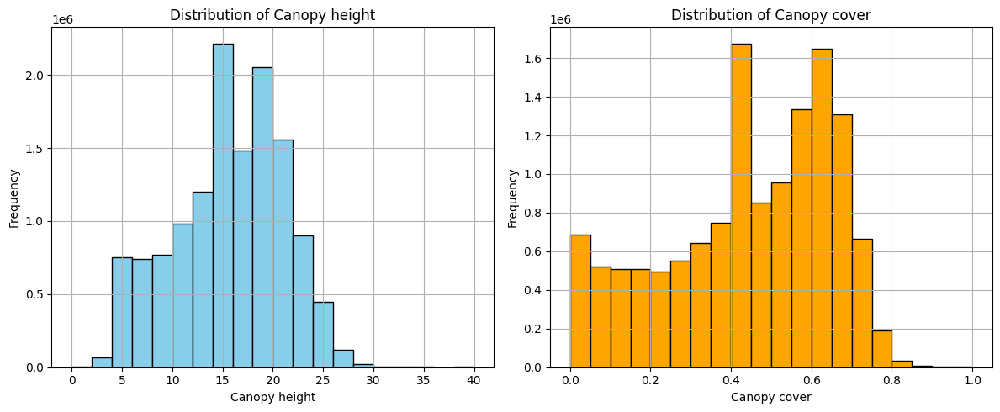

In [67]:
#Distribution of predicted canopy height and canopy cover

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(canopy_da.sel(variable='canopy_height').values.flatten(),
         bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution of Canopy height")
plt.xlabel("Canopy height")
plt.ylabel("Frequency")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.hist(canopy_da.sel(variable='tree_cover').values.flatten(),
         bins=20, color='orange', edgecolor='black')
plt.title("Distribution of Canopy cover")
plt.xlabel("Canopy cover")
plt.ylabel("Frequency")
plt.grid(True)

plt.tight_layout()

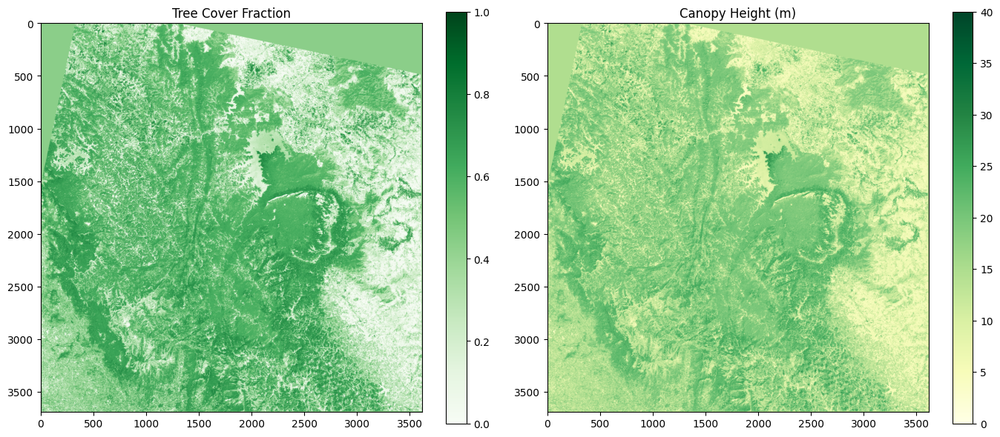

In [28]:
# Plot the predicted canopy height and canopy cover rasters

tree_cover = canopy_da.sel(variable="tree_cover")
canopy_height = canopy_da.sel(variable="canopy_height")

fig, axs = plt.subplots(1, 2, figsize=(14, 6))

im0 = axs[0].imshow(tree_cover, cmap='Greens')
axs[0].set_title("Tree Cover Fraction")
plt.colorbar(im0, ax=axs[0])


im1 = axs[1].imshow(canopy_height, cmap='YlGn')
axs[1].set_title("Canopy Height (m)")
plt.colorbar(im1, ax=axs[1])

plt.tight_layout()
plt.show()

In [29]:
# Classify the raster into Primary forest, secondary forest and other areas
# based on canopy height and canopy cover

classification = xr.full_like(tree_cover, fill_value=0, dtype=int)

classification = classification.where(~((tree_cover > 0.7) & (canopy_height > 20)), 1)

classification = classification.where(~(((tree_cover > 0.2) & (tree_cover <= 0.7)) &
                                        ((canopy_height > 6) & (canopy_height <= 20))), 2)

classification = classification.where(~((tree_cover <= 0.2) & (canopy_height <= 6)), 3)


In [30]:
classification.shape

(3689, 3615)

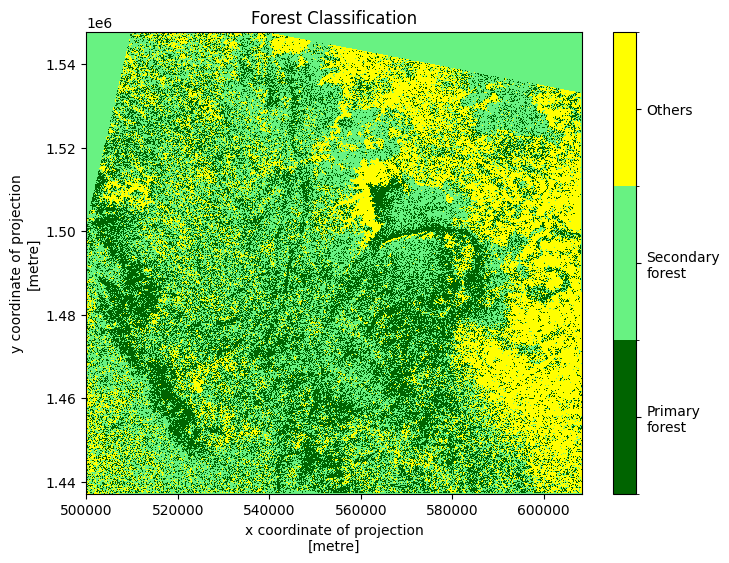

In [35]:
#Plot the classified raster

import matplotlib.colors as mcolors

cmap = mcolors.ListedColormap(['#006400', '#68F282', '#FFFF00'])
bounds = [0.5, 1.5, 2.5, 3.5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

plt.figure(figsize=(8, 6))
im = classification.plot(cmap=cmap, norm=norm, add_colorbar=False)

cbar = plt.colorbar(im, ticks=[1, 2, 3])
cbar.ax.set_yticklabels(['Primary\nforest', 'Secondary\nforest', 'Others'])
plt.title("Forest Classification")
plt.show()


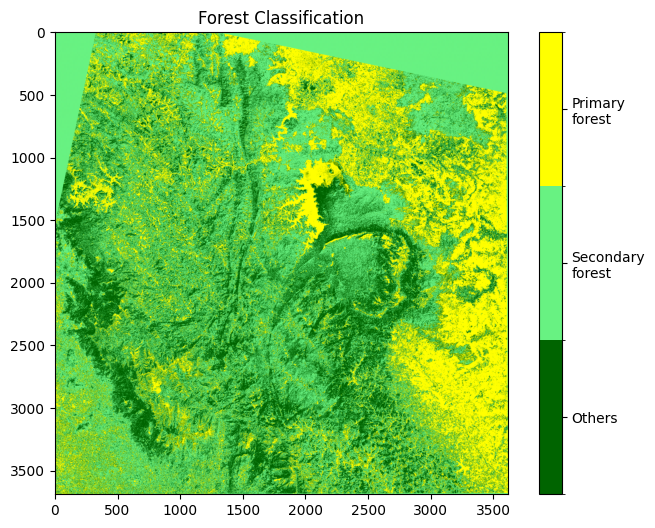

In [32]:
# Smoothen the image for better visualization

from scipy.ndimage import gaussian_filter

classification_smooth = gaussian_filter(classification, sigma = 0.01)

plt.figure(figsize=(8, 6))
im = plt.imshow(classification_smooth, cmap=cmap, norm=norm)

cbar = plt.colorbar(im, ticks=[1, 2, 3])
cbar.ax.set_yticklabels(['Primary\nforest', 'Secondary\nforest', 'Others'])
plt.title("Forest Classification")
plt.show()

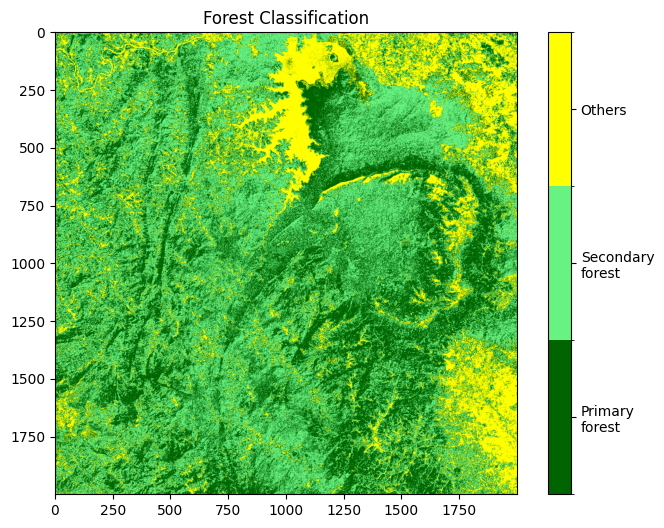

In [44]:
plt.figure(figsize=(8, 6))
im = plt.imshow(classification_smooth[1000:3000, 1000:3000], cmap=cmap, norm=norm)

cbar = plt.colorbar(im, ticks=[1, 2, 3])
cbar.ax.set_yticklabels(['Primary\nforest', 'Secondary\nforest', 'Others'])
plt.title("Forest Classification")
plt.savefig("Forest Classification.png", bbox_inches='tight', dpi=300)
plt.show()

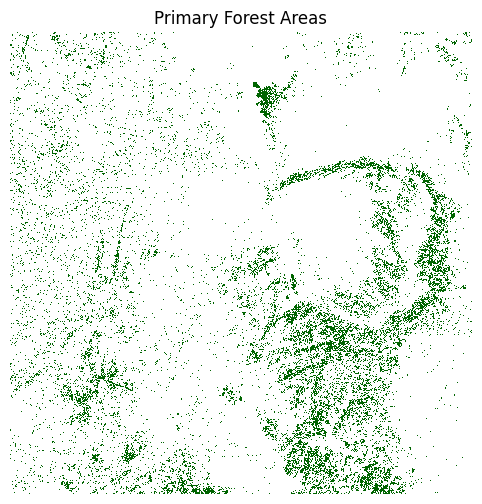

In [45]:
#Visualize only the primary forest area

primary_forest_mask = (classification_smooth == 1)

primary_forest_display = np.where(primary_forest_mask, 1, np.nan)

plt.figure(figsize=(8, 6))
plt.imshow(primary_forest_display[1000:3000, 1000:3000],
           cmap=mcolors.ListedColormap(['#006400']),
           interpolation='none')

plt.title("Primary Forest Areas")
plt.axis('off')
plt.savefig('Primary forest area.png',bbox_inches='tight', dpi = 300)
plt.show()

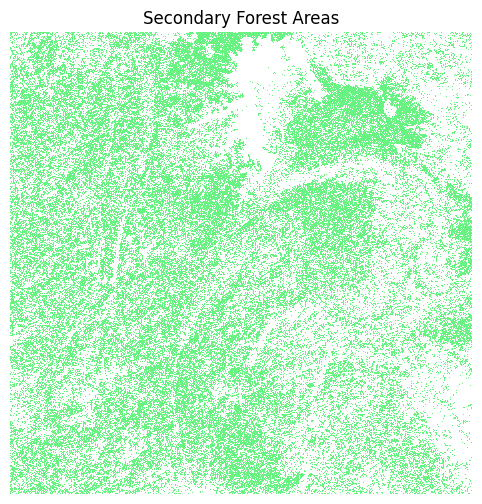

In [46]:
#Visualize only the secondary forest area

secondary_forest_mask = (classification_smooth == 2)

secondary_forest_mask = np.where(secondary_forest_mask, 1, np.nan)

plt.figure(figsize=(8, 6))
plt.imshow(secondary_forest_mask[1000:3000, 1000:3000],
           cmap=mcolors.ListedColormap(['#68F282']),
           interpolation='none')

plt.title("Secondary Forest Areas")
plt.axis('off')
plt.savefig('Secondary forest area.png',bbox_inches='tight', dpi = 300)
plt.show()

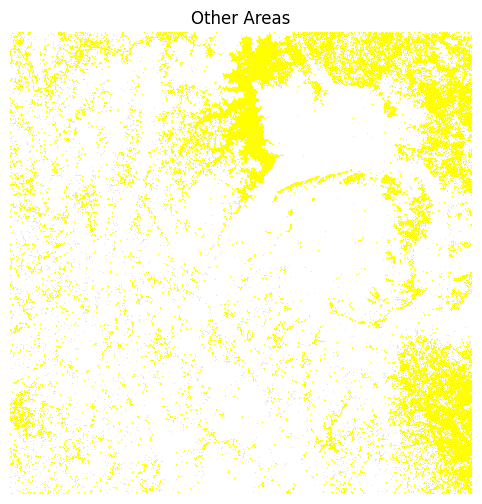

In [47]:
#Visualize only the other landcover area

other_mask = (classification_smooth == 3)

other_mask = np.where(other_mask, 1, np.nan)

plt.figure(figsize=(8, 6))
plt.imshow(other_mask[1000:3000, 1000:3000],
           cmap=mcolors.ListedColormap(['#FFFF00']),
           interpolation='none')

plt.title("Other Areas")
plt.axis('off')
plt.savefig('Other area.png',bbox_inches='tight', dpi = 300)
plt.show()
